In [1]:
import os
os.chdir('/ictstr01/home/icb/fatemehs.hashemig/codes/interpretable-ssl')

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [2]:
import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
from importlib import reload

import interpretable_ssl.trainers.scproto_utils
import interpretable_ssl.datasets.dataset_configs
import interpretable_ssl.datasets.dataset
import interpretable_ssl.configs.defaults
import interpretable_ssl.evaluation.de_helper
import interpretable_ssl.evaluation.cd4_marker
import interpretable_ssl.evaluation.metric_helpers.embedding_metrics
import interpretable_ssl.augmenters.graph_generator
import interpretable_ssl.augmenters.adata_augmenter
import interpretable_ssl.models.swav
import interpretable_ssl.trainers.base
import interpretable_ssl.trainers.trainer
import interpretable_ssl.trainers.adaptive_trainer
import interpretable_ssl.trainers.scproto

reload(interpretable_ssl.trainers.scproto_utils)
reload(interpretable_ssl.datasets.dataset_configs)
reload(interpretable_ssl.datasets.dataset)
reload(interpretable_ssl.configs.defaults)
reload(interpretable_ssl.evaluation.de_helper)
reload(interpretable_ssl.evaluation.cd4_marker)
reload(interpretable_ssl.evaluation.metric_helpers.embedding_metrics)
reload(interpretable_ssl.augmenters.graph_generator)
reload(interpretable_ssl.augmenters.adata_augmenter)
reload(interpretable_ssl.models.swav)
reload(interpretable_ssl.trainers.base)
reload(interpretable_ssl.trainers.trainer)
reload(interpretable_ssl.trainers.adaptive_trainer)
reload(interpretable_ssl.trainers.scproto)
from interpretable_ssl.trainers.scproto import *

from interpretable_ssl.evaluation.metric_helpers.embedding_tables import *


# t = SCProtoTrainer(debug=1, workers=0, dataset_id = '0.3pancreas', full_dataset_mode = 1, affinity_type = 'arbf')
# t.setup()

 captum (see https://github.com/pytorch/captum).
INFO:faiss.loader:Loading faiss with AVX2 support.
INFO:faiss.loader:Could not load library with AVX2 support due to:
ModuleNotFoundError("No module named 'faiss.swigfaiss_avx2'")
INFO:faiss.loader:Loading faiss.
INFO:faiss.loader:Successfully loaded faiss.


In [3]:
t = SCProtoTrainer(debug=1, workers=0, dataset_id = 's28nsc', affinity_type = 'sarbf', lambda_kl = 0.0, lambda_proto_recon = 0.5, p = 0.0, version=25, experiment_name= 'swav')

t.setup()


INFO:root:['NVIDIA A100 80GB PCIe']


dataset is None, loading s28nsc
loading s28nsc data
⚠️ No HVG column found.
Embedding dictionary:
 	Num conditions: [1]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 960 31 10
	Mean/Var Layer in/out: 31 8
Decoder Architecture:
	First Layer in, out and cond:  8 31 10
	Output Layer in/out:  31 960 



INFO:root:=======>Building model done. max value for adata fed to scpoli_wrapper: 8.688319206237793


adam


INFO:root:Optimizer 'adam' built successfully.


The model is being trained without using prototypes.


INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 1109.63 - val_cvae_loss: 1109.63


INFO:root:initalizing prototypes using kmeans


  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

In [ ]:
t.pretrain_encoder()
t.init_prototypes()
ad = t.train_ds.adata
sim = t.encode_adata(ad, t.model, z_idx = 2)

D shape: (58423, 700)
global min/median/mean/max: -75.0 -13.057182 -14.25612 0.0


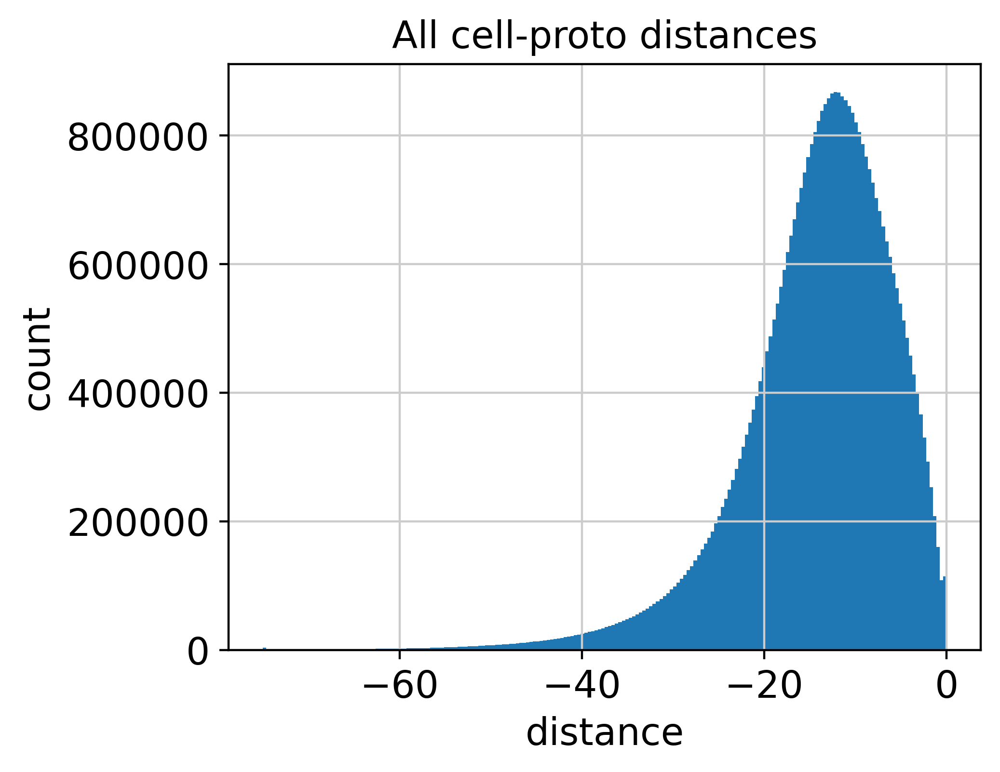

In [25]:
import numpy as np
import matplotlib.pyplot as plt

def get_dist(sim):
    D = sim
    if hasattr(D, "detach"):
        D = D.detach().cpu().numpy()
    
    print("D shape:", D.shape)
    print("global min/median/mean/max:",
          D.min(), np.median(D), D.mean(), D.max())
    
    plt.figure(figsize=(5,4))
    plt.hist(D.ravel(), bins=200)
    plt.xlabel("distance")
    plt.ylabel("count")
    plt.title("All cell-proto distances")
    plt.show()
get_dist(sim)

In [26]:
pt = SCProtoTrainer(debug=1, workers=0, dataset_id = 'pancreas',)

pt.setup()
pt.pretrain_encoder()

INFO:root:['NVIDIA A100 80GB PCIe']


dataset is None, loading pancreas
loading pancreas data
✅ Already subsetted to HVGs (4000 genes).
Embedding dictionary:
 	Num conditions: [9]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



INFO:root:=======>Building model done. max value for adata fed to scpoli_wrapper: 13.002676963806152
INFO:root:Optimizer 'adam' built successfully.
INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


adam
The model is being trained without using prototypes.
Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 2346.05 - val_cvae_loss: 2346.05


In [27]:
pt.pretrain_encoder()
pt.init_prototypes()
ad = pt.train_ds.adata
psim = pt.encode_adata(ad, pt.model, z_idx = 2)

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


The model is being trained without using prototypes.
Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 2324.88 - val_cvae_loss: 2324.88


INFO:root:initalizing prototypes using kmeans


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

D shape: (16382, 220)
global min/median/mean/max: -55.66262 -9.122419 -9.68242 0.0


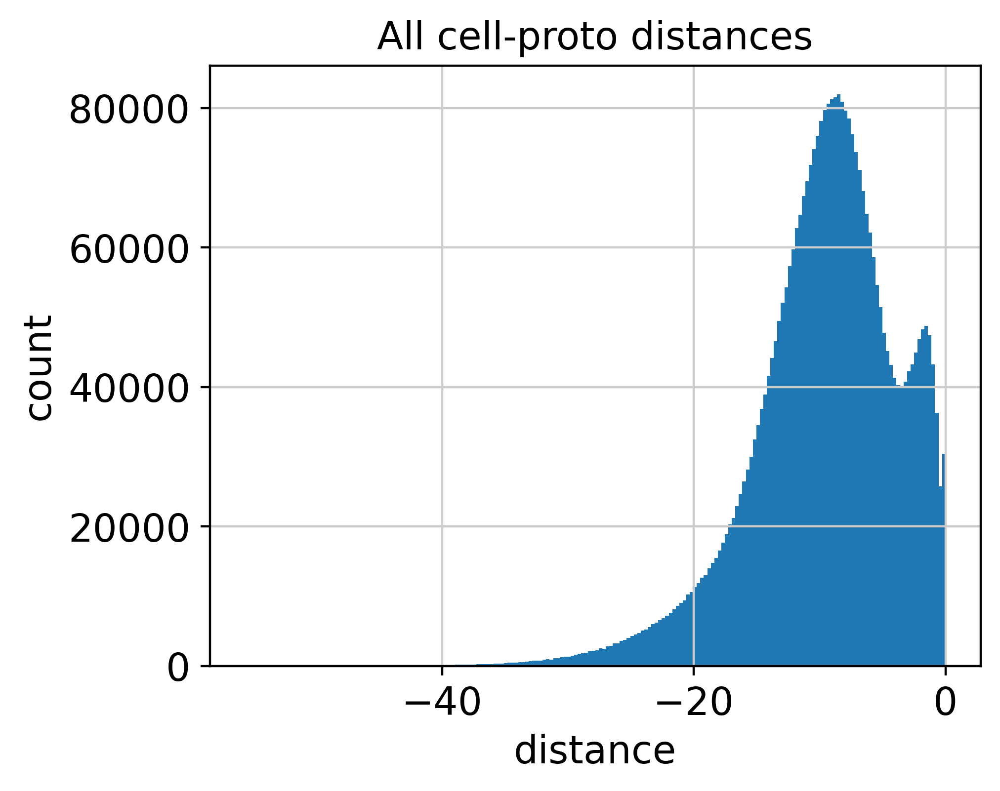

In [28]:
get_dist(psim)

In [ ]:
# pretrain model
# encode adata
# calc sample proto dist for 1 batch


In [30]:
p = F.softmax(sim / t.temperature, dim=1)
panc_p = F.softmax(psim / t.temperature, dim=1)

In [31]:
import numpy as np
import matplotlib.pyplot as plt

def compare_dist(sim1, sim2, name1="A", name2="B", bins=200, logy=True):
    def to_np(D):
        if hasattr(D, "detach"):
            D = D.detach().cpu().numpy()
        return D

    D1 = to_np(sim1)
    D2 = to_np(sim2)

    print(f"{name1} shape:", D1.shape)
    print(f"{name2} shape:", D2.shape)

    print(f"{name1} min/median/mean/max:",
          D1.min(), np.median(D1), D1.mean(), D1.max())
    print(f"{name2} min/median/mean/max:",
          D2.min(), np.median(D2), D2.mean(), D2.max())

    # shared bins (IMPORTANT)
    lo = min(D1.min(), D2.min())
    hi = max(D1.max(), D2.max())
    bins = np.linspace(lo, hi, bins)

    plt.figure(figsize=(6,4))
    plt.hist(D1.ravel(), bins=bins, alpha=0.5, label=name1, density=True)
    plt.hist(D2.ravel(), bins=bins, alpha=0.5, label=name2, density=True)
    plt.xlabel("distance")
    plt.ylabel("density")
    plt.title("Distance distribution comparison")
    if logy:
        plt.yscale("log")
    plt.legend()
    plt.tight_layout()
    plt.show()


A shape: (58423, 700)
B shape: (16382, 220)
A min/median/mean/max: 0.0 0.0 0.0014285712 1.0
B min/median/mean/max: 0.0 1.9624e-40 0.004545454 1.0


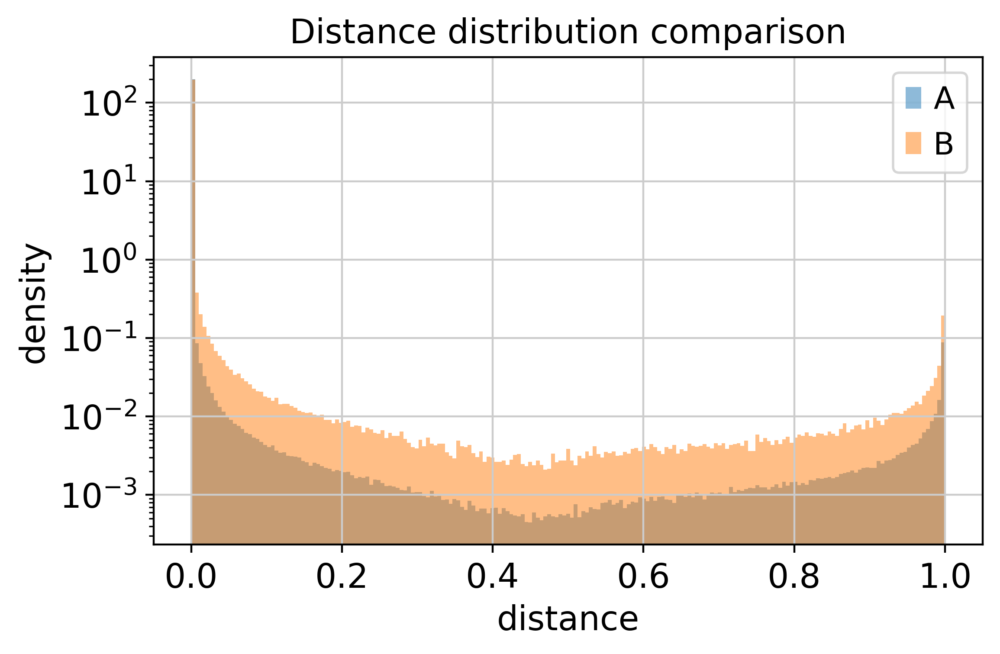

In [33]:
compare_dist(p, panc_p)

In [34]:
import numpy as np

def logits_report(S, name):
    if hasattr(S, "detach"):
        S = S.detach().cpu().numpy()
    frac_clamped = (S <= -75).mean()
    row_max = S.max(axis=1)          # should be ~0
    row_min = S.min(axis=1)
    row_mean = S.mean(axis=1)
    print(f"\n{name}")
    print("shape:", S.shape)
    print("frac(s<=-75):", frac_clamped)
    print("row_min median/p10/p90:", np.median(row_min), np.quantile(row_min, 0.1), np.quantile(row_min, 0.9))
    print("row_mean median/p10/p90:", np.median(row_mean), np.quantile(row_mean, 0.1), np.quantile(row_mean, 0.9))
    print("row_max median:", np.median(row_max))

logits_report(sim,  "NSCLC logits")
logits_report(psim, "Pancreas logits")



NSCLC logits
shape: (58423, 700)
frac(s<=-75): 8.629184689982664e-05
row_min median/p10/p90: -52.8636 -69.10177612304688 -36.794535827636714
row_mean median/p10/p90: -13.667969 -18.78306999206543 -10.316983032226561
row_max median: 0.0

Pancreas logits
shape: (16382, 220)
frac(s<=-75): 0.0
row_min median/p10/p90: -29.881994 -38.210730743408206 -23.499218940734863
row_mean median/p10/p90: -9.190554 -12.752582931518555 -6.87784252166748
row_max median: 0.0


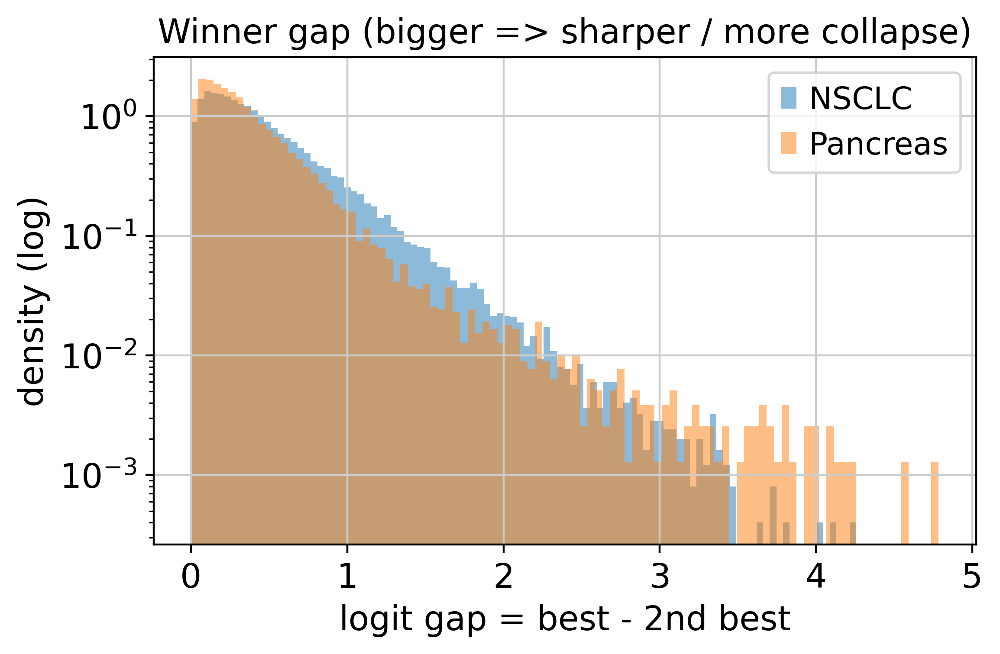

In [35]:
import numpy as np
import matplotlib.pyplot as plt

def winner_gap_plot(S, name):
    if hasattr(S, "detach"):
        S = S.detach().cpu().numpy()
    top2 = np.partition(S, -2, axis=1)[:, -2:]  # two largest logits
    gap = top2[:, 1] - top2[:, 0]               # (best - 2nd best), note: best is 0, so gap >= 0
    plt.hist(gap, bins=100, alpha=0.5, label=name, density=True)

plt.figure(figsize=(6,4))
winner_gap_plot(sim,  "NSCLC")
winner_gap_plot(psim, "Pancreas")
plt.yscale("log")
plt.xlabel("logit gap = best - 2nd best")
plt.ylabel("density (log)")
plt.title("Winner gap (bigger => sharper / more collapse)")
plt.legend()
plt.tight_layout()
plt.show()


In [36]:
import numpy as np

def active_vs_temp(S, K, temps, name):
    if hasattr(S, "detach"):
        S = S.detach().cpu().numpy()
    print(f"\n{name}")
    for T in temps:
        x = S / T
        x = x - x.max(axis=1, keepdims=True)
        P = np.exp(x)
        P /= P.sum(axis=1, keepdims=True)
        assign = P.argmax(axis=1)
        counts = np.bincount(assign, minlength=K)
        print(f"T={T:<5} active={int((counts>0).sum()):>4}/{K}")

temps = [0.02, 0.05, 0.1, 0.2, 0.4, 0.8]
active_vs_temp(sim,  sim.shape[1],  temps, "NSCLC")
active_vs_temp(psim, psim.shape[1], temps, "Pancreas")



NSCLC
T=0.02  active= 700/700
T=0.05  active= 700/700
T=0.1   active= 700/700
T=0.2   active= 700/700
T=0.4   active= 700/700
T=0.8   active= 700/700

Pancreas
T=0.02  active= 220/220
T=0.05  active= 220/220
T=0.1   active= 220/220
T=0.2   active= 220/220
T=0.4   active= 220/220
T=0.8   active= 220/220


In [37]:
import torch
import torch.nn.functional as F
import math

@torch.no_grad()
def find_temperature_for_entropy(s, target_frac=0.7, T_grid=None):
    # s: (N,K) logits (torch)
    K = s.size(1)
    target = target_frac * math.log(K)

    if T_grid is None:
        T_grid = torch.tensor([0.02,0.05,0.07,0.1,0.15,0.2,0.3,0.4,0.6,0.8,1.0], device=s.device)

    bestT, besterr = None, float("inf")
    for T in T_grid:
        p = F.softmax(s / T, dim=1)
        H = -(p * (p.clamp_min(1e-12).log())).sum(dim=1).mean().item()
        err = abs(H - target)
        if err < besterr:
            besterr, bestT = err, float(T.item())
    return bestT


In [51]:
find_temperature_for_entropy(sim, target_frac=0.2)

0.30000001192092896

In [50]:
find_temperature_for_entropy(psim, target_frac=0.2)

0.20000000298023224

In [43]:
@torch.no_grad()
def active_frac_for_T(s, T):
    p = F.softmax(s / T, dim=1)
    assign = p.argmax(dim=1)
    counts = torch.bincount(assign, minlength=s.size(1))
    return (counts > 0).float().mean().item()

@torch.no_grad()
def find_temperature_for_active_frac(s, target=0.5, T_grid=None):
    if T_grid is None:
        T_grid = torch.tensor([0.02,0.05,0.07,0.1,0.15,0.2,0.3,0.4,0.6,0.8,1.0], device=s.device)
    bestT, besterr = None, float("inf")
    for T in T_grid:
        frac = active_frac_for_T(s, T)
        err = abs(frac - target)
        if err < besterr:
            besterr, bestT = err, float(T.item())
    return bestT


In [44]:
find_temperature_for_active_frac(sim)

0.019999999552965164

In [45]:
find_temperature_for_active_frac(psim)

0.019999999552965164

In [ ]:
# row wise normalization

s = -d2
s = s - s.max(dim=1, keepdim=True)[0]
s = normalize_logits_rowwise(s, mode="zscore")
x = (s / T).clamp(min=-75)
p = softmax(x)


In [ ]:
# use higher temp, eps
# set automaticaly based on the entropy function
# q soft or hard?
# per row normalization?
# how about the kl? should i use temp or eps for kl? or set it off?
# how about affinities? [train with either arbf, spatial]


In [ ]:
def row_zscore(s, eps=1e-8):
    m = s.mean(dim=1, keepdim=True)
    v = s.std(dim=1, keepdim=True).clamp_min(eps)
    return (s - m) / v

# where you compute p and q:
logits = view_scores
logits = row_zscore(logits)         # <--- add
q = softmax(logits / self.epsilon)
p = softmax(logits / self.temperature)


In [52]:
import numpy as np
import scipy.sparse as sp

def aff_row_stats(A, name, n=2000, seed=0):
    rng = np.random.default_rng(seed)
    A = A.tocsr()
    idx = rng.choice(A.shape[0], size=min(n, A.shape[0]), replace=False)

    neff = []
    top1 = []
    top10 = []
    nnz = []

    for i in idx:
        start, end = A.indptr[i], A.indptr[i+1]
        vals = A.data[start:end]
        if len(vals) == 0:
            continue
        p = vals / vals.sum()
        nnz.append(len(p))
        neff.append(1.0 / np.sum(p**2))
        s = np.sort(p)[::-1]
        top1.append(s[0])
        top10.append(s[:10].sum() if len(s) >= 10 else s.sum())

    print(f"\n{name}")
    print("avg nnz:", np.mean(nnz), "median nnz:", np.median(nnz))
    print("Neff mean/median:", np.mean(neff), np.median(neff))
    print("top1 mean/median:", np.mean(top1), np.median(top1))
    print("top10 mean/median:", np.mean(top10), np.median(top10))


In [54]:
aff = t.train_ds.aff
aff_row_stats(aff, 'nsc')


nsc
avg nnz: 135.1055 median nnz: 122.0
Neff mean/median: 111.34984513205829 98.9773423507578
top1 mean/median: 0.021840372462936894 0.02217981410674635
top10 mean/median: 0.17659608125258347 0.18228309699688416


In [55]:
aff = pt.train_ds.aff
aff_row_stats(aff, 'panc')


panc
avg nnz: 29.759 median nnz: 27.0
Neff mean/median: 29.32933868774984 26.710883274094748
top1 mean/median: 0.04871458451355159 0.04780863082451789
top10 mean/median: 0.410504292038764 0.4132902575868754


In [ ]:
# set self.softmax = True also for sarbf (not only coaff)

# use temperature for affinity softmax e.g. 0.05–0.1

# set k_pos=10

# use st, sg?

# let's try to define a good affinity, then train again

In [56]:
def check_aff(aff):
    diag_is_zero = aff.diagonal().sum() == 0
    is_symmetric = (aff != aff.T).nnz == 0
    print(f'diagonal 0: {diag_is_zero}, is_symmetric: {is_symmetric}')

def plot_aff(ad, aff, k=None, random_state=0):
    if k is not None:
        rng = np.random.default_rng(random_state)
        idx = rng.choice(ad.n_obs, size=min(k, ad.n_obs), replace=False)
        ad = ad[idx].copy()
        aff = aff[idx][:, idx]

    ad.obsp["connectivities"] = aff.tocsr()
    ad.uns["neighbors"] = {
        "connectivities_key": "connectivities",
        "distances_key": None,
        "params": {"method": "sarb"},
    }

    sc.tl.umap(ad)
    sc.pl.umap(ad, color=[lk, "niches_2D"], wspace=1.2)

def load_aff(at):
    p = '/home/icb/fatemehs.hashemig/codes/interpretable-ssl/graphs/'
    f = f'affinity_s28nsc58423_ncomp50_kneighbors50_{at}.pkl'
    return pkl.load(open(f'{p}/{f}', 'rb'))

In [57]:
arbf = load_aff('arbf')

In [58]:
check_aff(arbf)

diagonal 0: True, is_symmetric: True


In [59]:
sp_aff = pkl.load(open('sp_aff.pkl', 'rb'))
check_aff(sp_aff)

diagonal 0: True, is_symmetric: True


In [61]:
def affinity_stats(A):
    A = A.tocsr()
    nnz = np.diff(A.indptr)

    # effective neighbors
    p = A.data.copy()
    p = p / np.repeat(A.sum(axis=1).A1, nnz)
    H = -np.bincount(
        np.repeat(np.arange(A.shape[0]), nnz),
        weights=p * np.log(p + 1e-12),
        minlength=A.shape[0]
    )
    Neff = np.exp(H)

    print("avg nnz:", nnz.mean(), "median nnz:", np.median(nnz))
    print("Neff mean/median:", Neff.mean(), np.median(Neff))


In [62]:
affinity_stats(arbf)

avg nnz: 80.44963456173083 median nnz: 67.0
Neff mean/median: 78.75995596327927 65.65724025934044


In [63]:
affinity_stats(sp_aff)

avg nnz: 54.883693066086984 median nnz: 54.0
Neff mean/median: 45.231005216328064 44.93628187729056


In [64]:
import numpy as np
import scipy.sparse as sp
from sklearn.neighbors import NearestNeighbors

def evaluate_affinity(
    A,              # csr (N,N), row-stochastic preferred
    X=None,         # (N,d) latent or PCA (optional but recommended)
    k_overlap=20,   # for knn overlap
    eps=1e-12
):
    A = A.tocsr()
    A.setdiag(0)
    A.eliminate_zeros()

    N = A.shape[0]
    nnz = np.diff(A.indptr)

    # ---------- basic stats ----------
    stats = {}
    stats["nnz_mean"]   = nnz.mean()
    stats["nnz_median"] = np.median(nnz)
    stats["frac_isolated"] = (nnz == 0).mean()

    # ---------- row-normalize ----------
    row_sum = A.sum(axis=1).A1
    valid = row_sum > 0
    A_norm = A.copy()
    A_norm.data /= np.repeat(row_sum[valid], nnz[valid])

    # ---------- entropy & Neff ----------
    ent = np.zeros(N)
    neff = np.zeros(N)

    for i in range(N):
        start, end = A_norm.indptr[i], A_norm.indptr[i+1]
        if start == end:
            continue
        p = A_norm.data[start:end]
        H = -(p * np.log(p + eps)).sum()
        ent[i] = H
        neff[i] = np.exp(H)

    stats["entropy_mean"]   = ent[valid].mean()
    stats["entropy_median"] = np.median(ent[valid])
    stats["Neff_mean"]      = neff[valid].mean()
    stats["Neff_median"]    = np.median(neff[valid])

    # ---------- top-k mass ----------
    top1, top10 = [], []
    for i in range(N):
        start, end = A_norm.indptr[i], A_norm.indptr[i+1]
        if end - start == 0:
            continue
        p = np.sort(A_norm.data[start:end])[::-1]
        top1.append(p[0])
        top10.append(p[:min(10, len(p))].sum())

    stats["top1_mean"]  = np.mean(top1)
    stats["top10_mean"] = np.mean(top10)

    # ---------- embedding consistency ----------
    if X is not None:
        knn = NearestNeighbors(k_overlap).fit(X)
        _, I = knn.kneighbors(X)

        overlap = []
        for i in range(N):
            aff_i = A.indices[A.indptr[i]:A.indptr[i+1]][:k_overlap]
            if len(aff_i) == 0:
                continue
            overlap.append(len(set(I[i]) & set(aff_i)) / k_overlap)

        stats["knn_overlap"] = np.mean(overlap)
    else:
        stats["knn_overlap"] = None

    # ---------- collapse risk score ----------
    # (heuristic but VERY predictive in practice)
    collapse_risk = (
        (stats["Neff_mean"] / 30.0) +
        (0.2 / max(stats["top1_mean"], eps)) +
        (stats["frac_isolated"] * 5.0)
    )
    stats["collapse_risk"] = collapse_risk

    return stats


In [66]:
evaluate_affinity(sp_aff)

{'nnz_mean': 54.883693066086984,
 'nnz_median': 54.0,
 'frac_isolated': 0.0,
 'entropy_mean': 3.80928604399017,
 'entropy_median': 3.8052455280716497,
 'Neff_mean': 45.231005216328064,
 'Neff_median': 44.93628187729055,
 'top1_mean': 0.04430280778436269,
 'top10_mean': 0.37595533772436673,
 'knn_overlap': None,
 'collapse_risk': 6.022086733155519}

In [83]:
def row_normalize(A, eps=1e-12):
    A = A.tocsr(copy=True)
    row_sum = A.sum(axis=1).A1
    nz = row_sum > 0
    A.data /= np.repeat(row_sum[nz], np.diff(A.indptr)[nz])
    return A

def topk_per_row(A, k=20):
    A = A.tocsr(copy=True)
    for i in range(A.shape[0]):
        start, end = A.indptr[i], A.indptr[i+1]
        if end - start <= k:
            continue
        vals = A.data[start:end]
        keep = np.argpartition(-vals, k-1)[:k]
        mask = np.zeros(end - start, dtype=bool)
        mask[keep] = True
        A.data[start:end][~mask] = 0
    A.eliminate_zeros()
    return A

In [100]:
from sklearn.preprocessing import normalize
A_expr_n =  normalize(A_expr_n, norm="l1", axis=1)
A_sp_n   = normalize(A_sp_n, norm="l1", axis=1)

# product-of-experts
A = A_expr_n.multiply(A_sp_n)
A.eliminate_zeros()

# fallback BEFORE pruning
empty = np.diff(A.indptr) == 0
A[empty] = arbf[empty]   # raw arbf, not normalized

# entropy control
A = topk_per_row(A, k=20)

# final normalization
A = row_normalize(A)

evaluate_affinity(A)

{'nnz_mean': 11.516200811324307,
 'nnz_median': 20.0,
 'frac_isolated': 0.0,
 'entropy_mean': 1.7956506215733354,
 'entropy_median': 2.9893455234281845,
 'Neff_mean': 11.391177508448022,
 'Neff_median': 19.872672036242943,
 'top1_mean': 0.3983672954472566,
 'top10_mean': 0.7516631035229416,
 'knn_overlap': None,
 'collapse_risk': 0.8817551621692015}

In [101]:
A_expr_n.max(), A_sp_n.max()

(0.048531700174187294, 0.13501438152590808)

In [102]:
check_aff(A)

diagonal 0: True, is_symmetric: False


In [103]:
from interpretable_ssl.datasets.dataset_configs import *
ad, bk, lk, n = load_ds('s28nsc')

In [105]:
sarbf = load_aff('sarbf')
evaluate_affinity(sarbf)

{'nnz_mean': 133.29514061243003,
 'nnz_median': 121.0,
 'frac_isolated': 0.0,
 'entropy_mean': 4.760386539190193,
 'entropy_median': 4.6868933954311895,
 'Neff_mean': 120.90397062485495,
 'Neff_median': 108.51554074876377,
 'top1_mean': 0.02210955295704567,
 'top10_mean': 0.17861200618391784,
 'knn_overlap': None,
 'collapse_risk': 13.075995940303034}

In [108]:
A = topk_per_row(sarbf, k=20)
evaluate_affinity(A)

{'nnz_mean': 20.0,
 'nnz_median': 20.0,
 'frac_isolated': 0.0,
 'entropy_mean': 2.9674503255079,
 'entropy_median': 2.968846815403061,
 'Neff_mean': 19.44310477301655,
 'Neff_median': 19.469454770123352,
 'top1_mean': 0.07416706651261865,
 'top10_mean': 0.5986521700010096,
 'knn_overlap': None,
 'collapse_risk': 3.344718167978217}

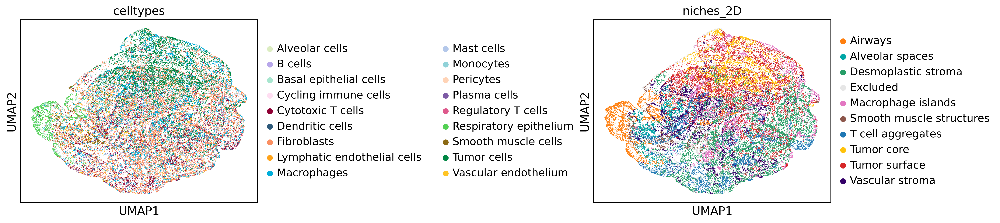

In [109]:
A = A.maximum(A.T)
plot_aff(ad, A)

In [110]:
import numpy as np

def evaluate_affinity_label_purity(
    ad,
    A,                     # csr affinity (N,N)
    celltype_key,          # e.g. "cell_type"
    niche_key,             # e.g. "niches_2D"
    k=None                 # optionally only top-k neighbors per cell
):
    A = A.tocsr()
    A.setdiag(0)
    A.eliminate_zeros()

    ct = ad.obs[celltype_key].to_numpy()
    niche = ad.obs[niche_key].to_numpy()

    N = A.shape[0]

    ct_purity = np.full(N, np.nan)
    niche_purity = np.full(N, np.nan)
    joint_purity = np.full(N, np.nan)
    nnz = np.zeros(N, dtype=int)

    for i in range(N):
        start, end = A.indptr[i], A.indptr[i+1]
        if start == end:
            continue

        nbrs = A.indices[start:end]
        vals = A.data[start:end]

        # optional: restrict to top-k neighbors
        if k is not None and len(nbrs) > k:
            keep = np.argsort(vals)[::-1][:k]
            nbrs = nbrs[keep]

        nnz[i] = len(nbrs)

        ct_i = ct[i]
        niche_i = niche[i]

        same_ct = (ct[nbrs] == ct_i)
        same_niche = (niche[nbrs] == niche_i)

        ct_purity[i] = same_ct.mean()
        niche_purity[i] = same_niche.mean()
        joint_purity[i] = (same_ct & same_niche).mean()

    # dataset-level summary
    summary = {
        "ct_purity_mean": np.nanmean(ct_purity),
        "ct_purity_median": np.nanmedian(ct_purity),
        "niche_purity_mean": np.nanmean(niche_purity),
        "niche_purity_median": np.nanmedian(niche_purity),
        "joint_purity_mean": np.nanmean(joint_purity),
        "joint_purity_median": np.nanmedian(joint_purity),
        "avg_nnz": nnz[nnz > 0].mean() if np.any(nnz > 0) else 0.0,
    }

    per_cell = {
        "ct_purity": ct_purity,
        "niche_purity": niche_purity,
        "joint_purity": joint_purity,
        "nnz": nnz,
    }

    return summary, per_cell


In [116]:
A = topk_per_row(sp_aff, k=20)

In [117]:


evaluate_affinity_label_purity(ad, A, lk, 'niches_2D')

({'ct_purity_mean': 0.34769183369563356,
  'ct_purity_median': 0.3,
  'niche_purity_mean': 0.7655332660082502,
  'niche_purity_median': 0.85,
  'joint_purity_mean': 0.27634578847371755,
  'joint_purity_median': 0.2,
  'avg_nnz': 20.0},
 {'ct_purity': array([0.05, 0.7 , 0.9 , 1.  , 1.  , 1.  , 1.  , ..., 0.2 , 0.  , 0.9 ,
         0.2 , 0.35, 0.25, 0.  ]),
  'niche_purity': array([0.6 , 0.5 , 0.55, 1.  , 1.  , 1.  , 1.  , ..., 0.8 , 0.9 , 1.  ,
         0.65, 1.  , 0.25, 0.7 ]),
  'joint_purity': array([0.05, 0.35, 0.5 , 1.  , 1.  , 1.  , 1.  , ..., 0.2 , 0.  , 0.9 ,
         0.2 , 0.35, 0.15, 0.  ]),
  'nnz': array([20, 20, 20, 20, 20, 20, 20, ..., 20, 20, 20, 20, 20, 20, 20])})

In [118]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def compute_context_vectors(ad, sp_key="spatial", X_key="X_pca", k=30):
    X = ad.obsm[X_key]
    sp = ad.obsm[sp_key]

    nn = NearestNeighbors(n_neighbors=k + 1).fit(sp)
    _, I = nn.kneighbors(sp)

    C = np.empty_like(X)
    for i in range(X.shape[0]):
        C[i] = X[I[i, 1:]].mean(axis=0)

    return C


In [137]:
C = compute_context_vectors(ad, sp_key="spatial", X_key="X_pca", k=30)

In [138]:
C.shape

(58423, 50)

In [139]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def knn_niche_purity(C, niches, k=20):
    niches = np.asarray(niches)

    nn = NearestNeighbors(n_neighbors=k + 1).fit(C)
    _, I = nn.kneighbors(C)

    purity = np.zeros(C.shape[0])
    for i in range(C.shape[0]):
        nbrs = I[i, 1:]
        purity[i] = (niches[nbrs] == niches[i]).mean()

    return {
        "niche_purity_mean": purity.mean(),
        "niche_purity_median": np.median(purity),
        "per_cell": purity,
    }
res = knn_niche_purity(
    C,
    ad.obs["niches_2D"].values,
    k=20
)

print(res["niche_purity_mean"], res["niche_purity_median"])


0.7888973520702464 0.9


In [140]:
res = knn_niche_purity(
    C,
    ad.obs["niches_2D"].values,
    k=50
)

print(res["niche_purity_mean"], res["niche_purity_median"])


0.7311521147493283 0.82


In [157]:
ad, bk, lk, n = load_ds('s28nsc')
ad.obsm['context'] = C

In [158]:
# ad.obsp.pop('connectivities')

In [159]:
import SEACells
cmodel = SEACells.build_graph.SEACellGraph(ad, "context", verbose=True)


In [160]:
ad

AnnData object with n_obs × n_vars = 58423 × 960
    obs: 'section', 'celltypes', 'niches_3D', 'niches_2D', 'fibroblast_subclusters', 'tumor_pseudotime_rank', 'EMT_niche'
    uns: 'EMT_niche_colors', 'celltypes_colors', 'fibroblast_subclusters_colors', 'log1p', 'niches_2D_colors', 'niches_3D_colors'
    obsm: 'X_umap_2D_neighbourhoods', 'X_umap_3D_neighbourhoods', 'X_umap_SCT', 'spatial', 'context'
    layers: 'SCT', 'counts'

In [161]:
caff = cmodel.rbf(20)

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/58423 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/58423 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/58423 [00:00<?, ?it/s]

Constructing CSR matrix...


In [164]:
import pickle as pkl

pkl.dump(caff, open('context_aff.pkl', 'wb'))

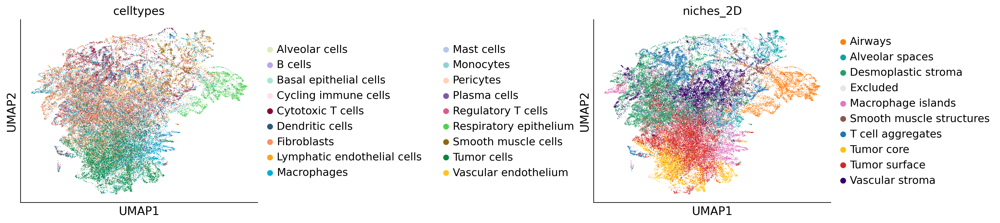

In [166]:
caff.setdiag(0)
caff = caff.maximum(A.T)
A.eliminate_zeros()
plot_aff(ad, caff)

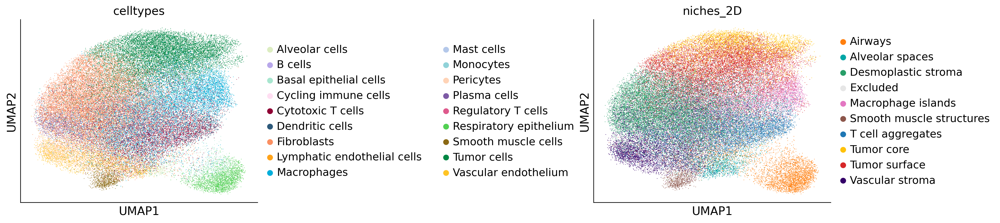

In [167]:
caff = normalize(caff, norm="l1", axis=1)
pca_aff = load_aff('arbf')
pca_aff = normalize(pca_aff, norm="l1", axis=1)
beta = 0.5
A = (1 - beta) * pca_aff + beta * caff
A = A.maximum(A.T)
plot_aff(ad, A)

In [169]:
evaluate_affinity_label_purity(ad, A, lk, 'niches_2D')

({'ct_purity_mean': 0.6578209346010133,
  'ct_purity_median': 0.7261904761904762,
  'niche_purity_mean': 0.45271896309085263,
  'niche_purity_median': 0.43529411764705883,
  'joint_purity_mean': 0.2817416960613053,
  'joint_purity_median': 0.22641509433962265,
  'avg_nnz': 103.33505639902093},
 {'ct_purity': array([0.08, 0.93, 1.  , 0.96, 0.99, 0.97, 1.  , ..., 0.63, 0.15, 0.65,
         0.62, 0.14, 0.46, 0.03]),
  'niche_purity': array([0.36, 0.6 , 0.76, 0.84, 0.85, 0.63, 0.81, ..., 0.2 , 0.22, 0.77,
         0.11, 0.38, 0.22, 0.08]),
  'joint_purity': array([0.03, 0.54, 0.76, 0.83, 0.85, 0.63, 0.81, ..., 0.02, 0.  , 0.64,
         0.04, 0.14, 0.08, 0.  ]),
  'nnz': array([118,  70,  99,  89,  73, 107,  78, ...,  84, 143,  94, 113, 125,
          95, 405])})

In [170]:
A = topk_per_row(A, k=20)

In [171]:
evaluate_affinity_label_purity(ad, A, lk, 'niches_2D')

({'ct_purity_mean': 0.3689736918679287,
  'ct_purity_median': 0.3,
  'niche_purity_mean': 0.772023004638584,
  'niche_purity_median': 0.85,
  'joint_purity_mean': 0.28978484500967083,
  'joint_purity_median': 0.2,
  'avg_nnz': 20.0},
 {'ct_purity': array([0.05, 0.85, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.15, 0.  , 0.8 ,
         0.2 , 0.3 , 0.4 , 0.1 ]),
  'niche_purity': array([0.8 , 0.65, 0.95, 1.  , 0.95, 1.  , 0.85, ..., 0.5 , 0.8 , 1.  ,
         0.45, 0.95, 0.25, 0.5 ]),
  'joint_purity': array([0.05, 0.55, 0.95, 1.  , 0.95, 1.  , 0.85, ..., 0.1 , 0.  , 0.8 ,
         0.2 , 0.3 , 0.15, 0.  ]),
  'nnz': array([20, 20, 20, 20, 20, 20, 20, ..., 20, 20, 20, 20, 20, 20, 20])})

In [174]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def two_stage_purity(ad, celltype_key, niche_key, k_pca=100, k_ctx=20, X_key="X_pca", C=None):
    X = ad.obsm[X_key]
    ct = ad.obs[celltype_key].to_numpy()
    ni = ad.obs[niche_key].to_numpy()

    nn_pca = NearestNeighbors(n_neighbors=k_pca + 1).fit(X)
    _, I_pca = nn_pca.kneighbors(X)

    pca_ct = []
    pca_ni = []
    ctx_ct = []
    ctx_ni = []

    for i in range(X.shape[0]):
        nbrs_pca = I_pca[i, 1:]
        pca_ct.append((ct[nbrs_pca] == ct[i]).mean())
        pca_ni.append((ni[nbrs_pca] == ni[i]).mean())

        if C is not None:
            Ci = C[nbrs_pca]
            nn_ctx = NearestNeighbors(n_neighbors=min(k_ctx, len(Ci))).fit(Ci)
            _, I_ctx = nn_ctx.kneighbors(C[i].reshape(1, -1))
            nbrs_ctx = nbrs_pca[I_ctx[0]]

            ctx_ct.append((ct[nbrs_ctx] == ct[i]).mean())
            ctx_ni.append((ni[nbrs_ctx] == ni[i]).mean())

    return {
        "pca_ct_mean": np.mean(pca_ct),
        "pca_ct_median": np.median(pca_ct),
        "pca_niche_mean": np.mean(pca_ni),
        "pca_niche_median": np.median(pca_ni),
        "ctx_ct_mean": np.mean(ctx_ct),
        "ctx_ct_median": np.median(ctx_ct),
        "ctx_niche_mean": np.mean(ctx_ni),
        "ctx_niche_median": np.median(ctx_ni),
    }


In [177]:
res = two_stage_purity(
    ad,
    celltype_key="celltypes",
    niche_key="niches_2D",
    k_pca=200,
    k_ctx=20,
    C=C
)
print(res)


{'pca_ct_mean': 0.7512782636975164, 'pca_ct_median': 0.895, 'pca_niche_mean': 0.33448504869657497, 'pca_niche_median': 0.305, 'ctx_ct_mean': 0.7693091761806139, 'ctx_ct_median': 0.9, 'ctx_niche_mean': 0.5663813908905738, 'ctx_niche_median': 0.6}


In [179]:
import numpy as np
import scipy.sparse as sp
from sklearn.neighbors import NearestNeighbors
def compute_sigma(C, k=20):
    nn = NearestNeighbors(n_neighbors=k + 1).fit(C)
    d, _ = nn.kneighbors(C)
    return np.sqrt(d[:, k] ** 2 + 1e-12)


def pca_context_agk(ad, C, k_pca=100, k_ctx=20, X_key="X_pca"):
    X = ad.obsm[X_key]
    N = X.shape[0]

    sigma = compute_sigma(C, k=k_ctx)

    nn = NearestNeighbors(n_neighbors=k_pca + 1).fit(X)
    _, I = nn.kneighbors(X)

    rows, cols, data = [], [], []

    for i in range(N):
        nbrs = I[i, 1:]
        diff = C[nbrs] - C[i]
        d2 = np.sum(diff * diff, axis=1)

        w = np.exp(-d2 / (sigma[i] * sigma[nbrs] + 1e-12))
        keep = np.argsort(w)[::-1][:k_ctx]

        rows.extend([i] * len(keep))
        cols.extend(nbrs[keep])
        data.extend(w[keep])

    A = sp.csr_matrix((data, (rows, cols)), shape=(N, N))
    return A
def row_normalize(A):
    A = A.tocsr(copy=True)
    s = A.sum(axis=1).A1
    nz = s > 0
    A.data /= np.repeat(s[nz], np.diff(A.indptr)[nz])
    return A
A = pca_context_agk(ad, C, k_pca=150, k_ctx=20)

In [180]:
A = topk_per_row(A, k=20)

In [181]:

evaluate_affinity_label_purity(ad, A, lk, 'niches_2D')

({'ct_purity_mean': 0.773757766633004,
  'ct_purity_median': 0.9,
  'niche_purity_mean': 0.5434657583485956,
  'niche_purity_median': 0.55,
  'joint_purity_mean': 0.4383333618609109,
  'joint_purity_median': 0.4,
  'avg_nnz': 20.0},
 {'ct_purity': array([0.15, 0.9 , 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.8 , 0.1 , 0.8 ,
         0.65, 0.35, 0.45, 0.  ]),
  'niche_purity': array([0.25, 0.75, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.05, 0.25, 1.  ,
         0.1 , 0.75, 0.2 , 0.05]),
  'joint_purity': array([0.  , 0.65, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.05, 0.  , 0.8 ,
         0.05, 0.35, 0.1 , 0.  ]),
  'nnz': array([20, 20, 20, 20, 20, 20, 20, ..., 20, 20, 20, 20, 20, 20, 20])})

In [182]:
A = A.maximum(A.T)
evaluate_affinity_label_purity(ad, A, lk, 'niches_2D')

({'ct_purity_mean': 0.7585857309114944,
  'ct_purity_median': 0.88,
  'niche_purity_mean': 0.536941312526203,
  'niche_purity_median': 0.55,
  'joint_purity_mean': 0.42422887201002857,
  'joint_purity_median': 0.39655172413793105,
  'avg_nnz': 33.23078239734351},
 {'ct_purity': array([0.14, 0.91, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.73, 0.18, 0.83,
         0.7 , 0.28, 0.56, 0.02]),
  'niche_purity': array([0.27, 0.73, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.09, 0.28, 1.  ,
         0.07, 0.83, 0.31, 0.17]),
  'joint_purity': array([0.03, 0.64, 1.  , 1.  , 1.  , 1.  , 1.  , ..., 0.05, 0.01, 0.83,
         0.04, 0.25, 0.18, 0.  ]),
  'nnz': array([ 79,  22,  45,  26,  24,  23,  24, ...,  44,  76,  29,  82,  36,
          45, 259])})

In [184]:
check_aff(A)

diagonal 0: True, is_symmetric: True


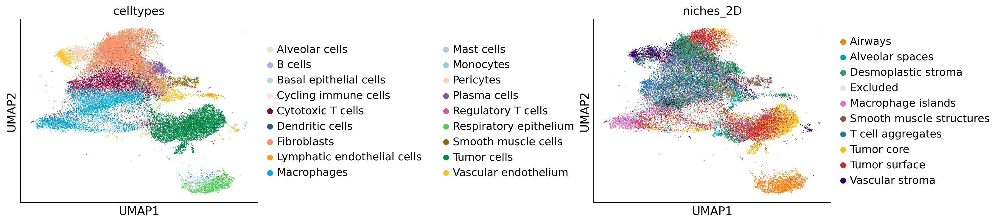

In [185]:
plot_aff(ad, A)

In [187]:
def save_aff(aff, at):
    p = '/home/icb/fatemehs.hashemig/codes/interpretable-ssl/graphs/'
    f = f'affinity_s28nsc58423_ncomp50_kneighbors50_{at}.pkl'
    return pkl.dump(aff, open(f'{p}/{f}', 'wb'))

In [188]:
save_aff(A, 'c')

In [198]:
check_aff(A)

diagonal 0: True, is_symmetric: True


In [200]:
ad, bk, lk, n = load_ds('s28nsc')

In [203]:
sc.tl.pca(ad)

In [204]:
def concat_pca_context(ad, C, pca_key="X_pca", w_ctx=1.0):
    Xp = ad.obsm[pca_key]
    Xc = C
    Xp = (Xp - Xp.mean(0)) / Xp.std(0)
    Xc = (Xc - Xc.mean(0)) / Xc.std(0)
    return np.concatenate([Xp, w_ctx * Xc], axis=1)
ad.obsm['w_ctx'] = concat_pca_context(ad, C)


In [207]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def knn_purity(X, ct, niche, k=20):
    nn = NearestNeighbors(n_neighbors=k + 1).fit(X)
    _, I = nn.kneighbors(X)

    ct = np.asarray(ct)
    niche = np.asarray(niche)

    ct_p = np.zeros(len(X))
    ni_p = np.zeros(len(X))

    for i in range(len(X)):
        nbrs = I[i, 1:]
        ct_p[i] = (ct[nbrs] == ct[i]).mean()
        ni_p[i] = (niche[nbrs] == niche[i]).mean()

    return {
        "ct_mean": ct_p.mean(),
        "ct_median": np.median(ct_p),
        "niche_mean": ni_p.mean(),
        "niche_median": np.median(ni_p),
    }

knn_purity(ad.obsm['w_ctx'], ad.obs[lk], ad.obs['niches_2D'])

{'ct_mean': 0.5880081474761651,
 'ct_median': 0.6,
 'niche_mean': 0.6558358865515294,
 'niche_median': 0.7}

In [219]:
len(ad) / ad.obs['niches_2D'].nunique()

5842.3

In [220]:
knn_purity(C, ad.obs[lk], ad.obs['niches_2D'], 200)

{'ct_mean': 0.3299982027626106,
 'ct_median': 0.275,
 'niche_mean': 0.6547322116289817,
 'niche_median': 0.72}

In [209]:
knn_purity(ad.obsm['X_pca'], ad.obs[lk], ad.obs['niches_2D'])

{'ct_mean': 0.791944953186245,
 'ct_median': 0.95,
 'niche_mean': 0.35771357170977186,
 'niche_median': 0.3}

In [210]:
knn_purity(ad.obsm['spatial'], ad.obs[lk], ad.obs['niches_2D'])

{'ct_mean': 0.3469078958629307,
 'ct_median': 0.3,
 'niche_mean': 0.7673886996559575,
 'niche_median': 0.85}

In [211]:
def two_stage_quantile_purity(X_pca, X_ctx, ct, niche, k1=100, q=0.2):
    ct = np.asarray(ct)
    niche = np.asarray(niche)

    nn = NearestNeighbors(n_neighbors=k1 + 1).fit(X_pca)
    _, I = nn.kneighbors(X_pca)

    ct_p = np.zeros(len(X_pca))
    ni_p = np.zeros(len(X_pca))

    for i in range(len(X_pca)):
        cand = I[i, 1:]
        d = np.sum((X_ctx[cand] - X_ctx[i])**2, axis=1)
        thr = np.quantile(d, q)
        keep = cand[d <= thr]

        ct_p[i] = (ct[keep] == ct[i]).mean()
        ni_p[i] = (niche[keep] == niche[i]).mean()

    return {
        "ct_mean": ct_p.mean(),
        "ct_median": np.median(ct_p),
        "niche_mean": ni_p.mean(),
        "niche_median": np.median(ni_p),
    }


In [221]:
two_stage_quantile_purity(
    C,
    ad.obsm['X_pca'],
    ad.obs[lk],
    ad.obs["niches_2D"],
    k1=200,
    q=0.1
)


{'ct_mean': 0.6811781563523174,
 'ct_median': 0.8,
 'niche_mean': 0.6698293969351601,
 'niche_median': 0.75}

In [223]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def dual_quantile_purity(X_pca, X_ctx, ct, niche, k1=150, q_pca=0.3, q_ctx=0.1):
    ct = np.asarray(ct)
    niche = np.asarray(niche)

    nn = NearestNeighbors(n_neighbors=k1 + 1).fit(X_pca)
    d_pca, I = nn.kneighbors(X_pca)

    ct_p = np.zeros(len(X_pca))
    ni_p = np.zeros(len(X_pca))

    for i in range(len(X_pca)):
        cand = I[i, 1:]
        d1 = d_pca[i, 1:]

        d2 = np.sum((X_ctx[cand] - X_ctx[i])**2, axis=1)
        d2 = (d2 - d2.min()) / (d2.max() - d2.min() + 1e-12)

        keep = cand[(d1 <= np.quantile(d1, q_pca)) &
                    (d2 <= np.quantile(d2, q_ctx))]

        if len(keep) == 0:
            keep = cand[d2 <= np.quantile(d2, q_ctx)]

        ct_p[i] = (ct[keep] == ct[i]).mean()
        ni_p[i] = (niche[keep] == niche[i]).mean()

    return {
        "ct_mean": ct_p.mean(),
        "ct_median": np.median(ct_p),
        "niche_mean": ni_p.mean(),
        "niche_median": np.median(ni_p),
    }
dual_quantile_purity(
    C,
    ad.obsm['X_pca'],
    ad.obs[lk],
    ad.obs["niches_2D"],
    k1=150,
    q_pca=0.2,
    q_ctx=0.1
)


{'ct_mean': 0.6904539198237741,
 'ct_median': 0.8571428571428571,
 'niche_mean': 0.781487096433265,
 'niche_median': 1.0}

In [227]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def dual_quantile_knn(
    X1, X2, labels1, labels2, k1=150, q1=0.3, q2=0.1
):
    labels1 = np.asarray(labels1)
    labels2 = np.asarray(labels2)

    nn = NearestNeighbors(n_neighbors=k1 + 1).fit(X1)
    d1, I = nn.kneighbors(X1)

    neighbors = []
    l1_p = np.zeros(len(X1))
    l2_p = np.zeros(len(X1))
    nnz = np.zeros(len(X1), dtype=int)

    for i in range(len(X1)):
        cand = I[i, 1:]
        d1_i = d1[i, 1:]

        d2_i = np.sum((X2[cand] - X2[i])**2, axis=1)
        d2_i = (d2_i - d2_i.min()) / (d2_i.max() - d2_i.min() + 1e-12)

        keep = cand[(d1_i <= np.quantile(d1_i, q1)) &
                    (d2_i <= np.quantile(d2_i, q2))]

        if len(keep) == 0:
            keep = cand[d2_i <= np.quantile(d2_i, q2)]

        neighbors.append(keep)
        nnz[i] = len(keep)
        
        l1_p[i] = (labels1[keep] == labels1[i]).mean()
        l2_p[i] = (labels2[keep] == labels2[i]).mean()

    stats = {
        "label1_mean": l1_p.mean(),
        "label1_median": np.median(l1_p),
        "label2_mean": l2_p.mean(),
        "label2_median": np.median(l2_p),
        "nnz_mean": nnz.mean(),
        "nnz_median": np.median(nnz),
        "nnz_min": nnz.min(),
        "nnz_max": nnz.max(),
    }

    return neighbors, stats, nnz


In [237]:
nbrs, stats, nnz = dual_quantile_knn(
    C,
    ad.obsm["X_pca"],
    ad.obs["niches_2D"],
    ad.obs[lk],
    k1=200,
    q1=0.2,
    q2=0.2,
)

print(stats)


{'label1_mean': 0.7589013617254834, 'label1_median': 0.8571428571428571, 'label2_mean': 0.62939873140538, 'label2_median': 0.7142857142857143, 'nnz_mean': 9.120243739623094, 'nnz_median': 9.0, 'nnz_min': 1, 'nnz_max': 40}


In [238]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def dual_quantile_knn_seq(X1, X2, y1, y2, k1=150, q1=0.3, q2=0.2, min_n=3):
    y1 = np.asarray(y1)
    y2 = np.asarray(y2)

    nn = NearestNeighbors(n_neighbors=k1 + 1).fit(X1)
    d1, I = nn.kneighbors(X1)

    n = X1.shape[0]
    nbrs = []
    p1 = np.zeros(n)
    p2 = np.zeros(n)
    nnz = np.zeros(n, int)

    for i in range(n):
        cand = I[i, 1:]
        d1_i = d1[i, 1:]

        thr1 = np.quantile(d1_i, q1)
        cand1 = cand[d1_i <= thr1]

        d2_i = ((X2[cand1] - X2[i]) ** 2).sum(1)
        d2_i = (d2_i - d2_i.min()) / (d2_i.max() - d2_i.min() + 1e-12)

        thr2 = np.quantile(d2_i, q2)
        keep = cand1[d2_i <= thr2]

        if keep.size < min_n:
            keep = cand1[np.argsort(d2_i)[:min_n]]

        nbrs.append(keep)
        nnz[i] = keep.size
        p1[i] = (y1[keep] == y1[i]).mean()
        p2[i] = (y2[keep] == y2[i]).mean()

    stats = {
        "label1_mean": p1.mean(),
        "label1_median": np.median(p1),
        "label2_mean": p2.mean(),
        "label2_median": np.median(p2),
        "nnz_mean": nnz.mean(),
        "nnz_median": np.median(nnz),
        "nnz_min": nnz.min(),
        "nnz_max": nnz.max(),
    }

    return nbrs, stats, nnz


In [242]:
nbrs, stats, nnz = dual_quantile_knn_seq(
    X1=C,
    X2=ad.obsm["X_pca"],
    y1=ad.obs["niches_2D"],
    y2=ad.obs[lk],
    k1=200,
    q1=0.5,
    q2=0.2,
    min_n=3,
)
print(stats)


{'label1_mean': 0.72093396436335, 'label1_median': 0.75, 'label2_mean': 0.686371377710833, 'label2_median': 0.875, 'nnz_mean': 8.000034233093132, 'nnz_median': 8.0, 'nnz_min': 8, 'nnz_max': 9}


In [245]:
import numpy as np
import scipy.sparse as sp

def nbrs_to_adaptive_rbf(nbrs, X, eps=1e-12, sym="avg"):
    n = X.shape[0]
    rows = np.repeat(np.arange(n), [len(a) for a in nbrs])
    cols = np.concatenate(nbrs)
    d2 = ((X[rows] - X[cols]) ** 2).sum(1)

    sigma = np.zeros(n)
    for i in range(n):
        a = nbrs[i]
        di = ((X[a] - X[i]) ** 2).sum(1)
        sigma[i] = np.sqrt(np.median(di) + eps)

    sig_i = sigma[rows] 
    sig_j = sigma[cols]
    w = np.exp(-d2 / (sig_i * sig_j))

    A = sp.csr_matrix((w, (rows, cols)), shape=(n, n))
    A.eliminate_zeros()

    # if sym == "avg":
    #     A = (A + A.T) * 0.5
    # elif sym == "max":
    #     A = A.maximum(A.T)

    return A


In [251]:
A = nbrs_to_adaptive_rbf(nbrs, ad.obsm['X_pca'])

In [248]:
check_aff(A)

diagonal 0: True, is_symmetric: False


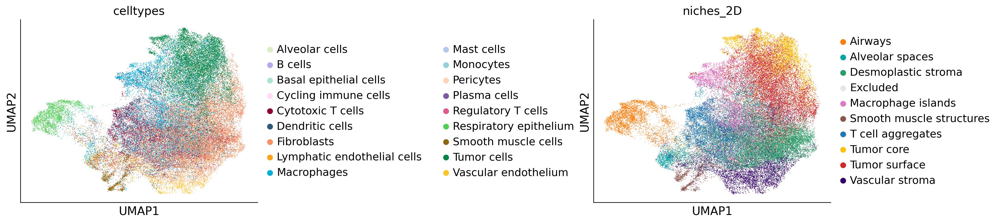

In [249]:
A = A.maximum(A.T)

plot_aff(ad, A)

In [250]:
import numpy as np

def weighted_purity_both(A, labels1, labels2):
    A = A.tocsr()
    labels1 = np.asarray(labels1)
    labels2 = np.asarray(labels2)

    p1 = np.zeros(A.shape[0])
    p2 = np.zeros(A.shape[0])

    for i in range(A.shape[0]):
        s, e = A.indptr[i], A.indptr[i + 1]
        if s == e:
            continue
        j = A.indices[s:e]
        w = A.data[s:e]
        wsum = w.sum()
        p1[i] = w[labels1[j] == labels1[i]].sum() / wsum
        p2[i] = w[labels2[j] == labels2[i]].sum() / wsum

    return {
        "label1_mean": p1.mean(),
        "label1_median": np.median(p1),
        "label2_mean": p2.mean(),
        "label2_median": np.median(p2),
        "per_cell": {"label1": p1, "label2": p2},
    }
res = weighted_purity_both(
    A,
    ad.obs[lk],
    ad.obs["niches_2D"],
)

print(res["label1_mean"], res["label1_median"])
print(res["label2_mean"], res["label2_median"])


0.674496223653851 0.7718739184218002
0.7120717954810053 0.7820579166384509


In [259]:
A = nbrs_to_adaptive_rbf(nbrs, ad.obsm['X_pca'])

In [260]:
res = weighted_purity_both(
    A,
    ad.obs[lk],
    ad.obs["niches_2D"],
)

print(res["label1_mean"], res["label1_median"])
print(res["label2_mean"], res["label2_median"])

0.6960980229696697 0.8446717308882549
0.7223736172316496 0.794176553742006


In [261]:
save_aff(A, 'c2')

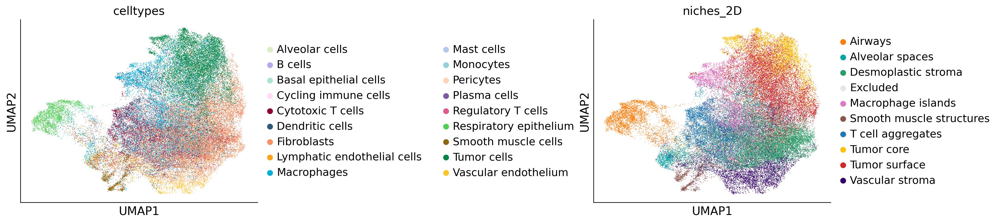

In [262]:
A = A.maximum(A.T)

plot_aff(ad, A)

In [ ]:
# final check for affinity
# generate knn on context k = 100, report purities, optional select q and report puritites again, return botk graphs
# adoptive guassian kernel on pca distances, reporrt weighted cell type and niche purities

In [263]:
def knn_graph(X, k):
    nn = NearestNeighbors(n_neighbors=k + 1).fit(X)
    _, I = nn.kneighbors(X)
    return [I[i, 1:] for i in range(X.shape[0])]
def purity_from_nbrs(nbrs, labels):
    labels = np.asarray(labels)
    p = np.zeros(len(nbrs))
    for i, nb in enumerate(nbrs):
        p[i] = (labels[nb] == labels[i]).mean()
    return p.mean(), np.median(p)


In [264]:
nbrs_ctx = knn_graph(C, k=100)

ct_mean, ct_med = purity_from_nbrs(nbrs_ctx, ad.obs[lk])
ni_mean, ni_med = purity_from_nbrs(nbrs_ctx, ad.obs["niches_2D"])

print("CTX kNN")
print("ct:", ct_mean, ct_med)
print("niche:", ni_mean, ni_med)


CTX kNN
ct: 0.3354683942967667 0.28
niche: 0.6898250688941 0.76


In [265]:
def quantile_refine(nbrs, X, q=0.2):
    out = []
    for i, nb in enumerate(nbrs):
        d = ((X[nb] - X[i])**2).sum(1)
        thr = np.quantile(d, q)
        keep = nb[d <= thr]
        out.append(keep if len(keep) > 0 else nb[:1])
    return out
nbrs_ctx_q = quantile_refine(nbrs_ctx, C, q=0.5)

ct_mean_q, ct_med_q = purity_from_nbrs(nbrs_ctx_q, ad.obs[lk])
ni_mean_q, ni_med_q = purity_from_nbrs(nbrs_ctx_q, ad.obs["niches_2D"])

print("CTX kNN + quantile")
print("ct:", ct_mean_q, ct_med_q)
print("niche:", ni_mean_q, ni_med_q)


CTX kNN + quantile
ct: 0.3414963285007617 0.28
niche: 0.7311521147493283 0.82


In [266]:
def adaptive_rbf_affinity(nbrs, X):
    n = X.shape[0]
    rows = np.repeat(np.arange(n), [len(a) for a in nbrs])
    cols = np.concatenate(nbrs)

    d2 = ((X[rows] - X[cols])**2).sum(1)

    sigma = np.zeros(n)
    for i, nb in enumerate(nbrs):
        di = ((X[nb] - X[i])**2).sum(1)
        sigma[i] = np.sqrt(np.median(di) + 1e-12)

    w = np.exp(-d2 / (sigma[rows] * sigma[cols] + 1e-12))
    A = sp.csr_matrix((w, (rows, cols)), shape=(n, n))
    A.eliminate_zeros()
    return A
A = adaptive_rbf_affinity(nbrs_ctx_q, ad.obsm["X_pca"])

In [267]:
def weighted_purity(A, labels):
    A = A.tocsr()
    labels = np.asarray(labels)
    p = np.zeros(A.shape[0])
    for i in range(A.shape[0]):
        s, e = A.indptr[i], A.indptr[i+1]
        if s == e:
            continue
        j = A.indices[s:e]
        w = A.data[s:e]
        p[i] = w[labels[j] == labels[i]].sum() / w.sum()
    return p.mean(), np.median(p)

ct_w_mean, ct_w_med = weighted_purity(A, ad.obs[lk])
ni_w_mean, ni_w_med = weighted_purity(A, ad.obs["niches_2D"])

print("Adaptive RBF (PCA distances, weighted)")
print("ct:", ct_w_mean, ct_w_med)
print("niche:", ni_w_mean, ni_w_med)


Adaptive RBF (PCA distances, weighted)
ct: 0.4170193822824892 0.3826989261106006
niche: 0.7340060967137056 0.8139499017546197


In [269]:
# so I see that only adoptive guassian ernel not enough, we need to filter out, then adoptive guassian kernel
# so the latter code was much better

# compare niche and cell type purities

In [189]:
name = 'swav_ds-s28n_NP700_hard1_aff-c_lpr0.5_finetune0_temp0.15_p0.0_laff0.0_v28'

In [190]:
t = SCProtoTrainer(experiment_name = 'swav', dataset_id = 's28nsc', hard_clustering = 1, affinity_type = 'c', lambda_proto_recon=0.5, temperature = 0.15, p = 0.0, lambda_aff=0.0, version = 28)

tname = t.get_model_name()
tname, tname == name

INFO:root:['NVIDIA A100 80GB PCIe']


dataset is None, loading s28nsc
loading s28nsc data
⚠️ No HVG column found.


('swav_ds-s28n_NP700_hard1_aff-c_lpr0.5_finetune0_temp0.15_p0.0_laff0.0_v28',
 True)

In [191]:
t.setup()
t.model = t.load_model()

INFO - 01/05/26 05:34:25 - 0:00:00 - ============ Initialized logger ============
INFO - 01/05/26 05:34:25 - 0:00:00 - adoptive_eps: 0
                                     affinity_type: c
                                     assignment_metric: sneuc
                                     augmentation_type: knn
                                     base_lr: 0.0003
                                     batch_key: section
                                     batch_removal_ratio: 0.0
                                     batch_sinkhorn: 1
                                     batch_size: 1024
                                     beta: 0.3
                                     cell_type_key: cell_type
                                     cell_w_mode: uniform
                                     checkpoint_freq: 30
                                     condition_key: section
                                     cvae_epochs: 25
                                     cvae_loss_scaler: 0.01
            

Embedding dictionary:
 	Num conditions: [1]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 960 31 10
	Mean/Var Layer in/out: 31 8
Decoder Architecture:
	First Layer in, out and cond:  8 31 10
	Output Layer in/out:  31 960 



INFO - 01/05/26 05:34:29 - 0:00:05 - =======>Building model done. max value for adata fed to scpoli_wrapper: 8.688319206237793
INFO - 01/05/26 05:34:32 - 0:00:07 - Optimizer 'adam' built successfully.


adam
Embedding dictionary:
 	Num conditions: [1]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 960 31 10
	Mean/Var Layer in/out: 31 8
Decoder Architecture:
	First Layer in, out and cond:  8 31 10
	Output Layer in/out:  31 960 



In [192]:
seacell_ad, seacell_mc = load_seacell('s28nsc')

In [193]:
self = t
ad = self.train_.adata.copy()

mc_ad, sim = get_scproto_mc_adata(
    self,
    ad,
    self.dataset.batch_key,
    self.dataset.label_key,
    self.epsilon,
    model=self.model,
    similarity=self.lsim,
    pl_version=self.pl_version,
)
ad.obs["SEACell"] = sim.argmax(axis=1)
ad.obs["mc_idx"] = ad.obs["SEACell"].values
protos = self.model.get_prototypes()
sample_protos = protos[ad.obs["SEACell"]]
batch = self.train_ds.conditions.to("cuda")
ad.layers["metacell"] = (
    self.model.decode(sample_protos, batch).detach().cpu().numpy()
)

  0%|          | 0/58 [00:00<?, ?it/s]

In [194]:
ad.obs["SEACell"].nunique()

695

In [195]:
import pandas as pd

def lk_purity(ad, lk_arr):
    out = pd.DataFrame(index=ad.obs['SEACell'].unique())
    for lk in lk_arr:
        df = ad.obs[['SEACell', lk]].copy()
        tab = pd.crosstab(df['SEACell'], df[lk])
        ratio = tab.div(tab.sum(axis=1), axis=0)
        out[f'{lk}_purity'] = ratio.max(axis=1)
        out[f'{lk}_label'] = ratio.idxmax(axis=1)
    return out.reset_index(names='SEACell')
scproto_out = lk_purity(ad, [lk, 'niches_2D'])
seacell_out= lk_purity(seacell_ad, [lk, 'niches_2D'])

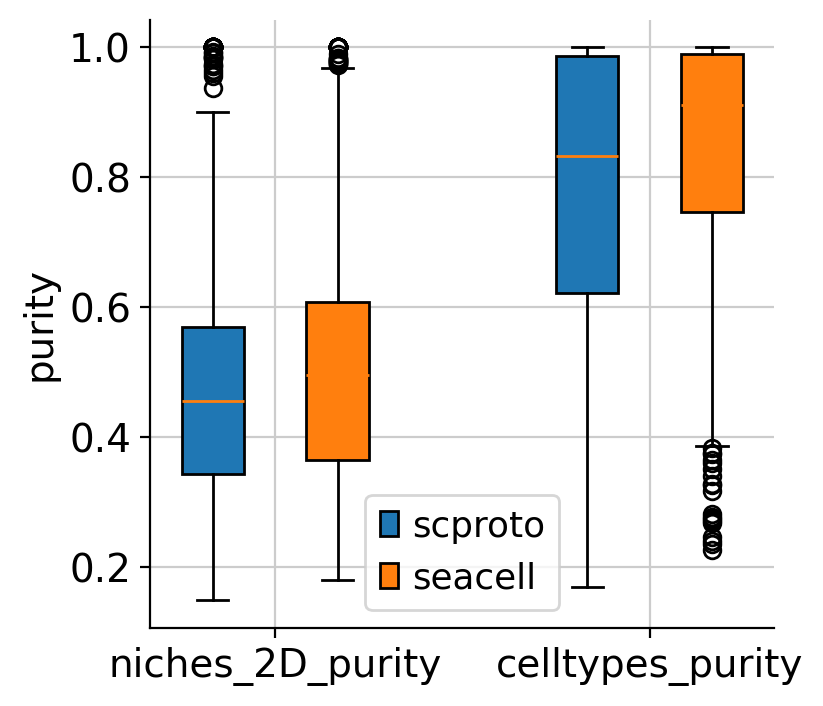

In [196]:
import matplotlib.pyplot as plt

keys = ['niches_2D_purity', 'celltypes_purity']
models = {
    'scproto': scproto_out,
    'seacell': seacell_out,
}

fig, ax = plt.subplots()

pos = [1, 2, 4, 5]
data = [
    models['scproto'][keys[0]].dropna(),
    models['seacell'][keys[0]].dropna(),
    models['scproto'][keys[1]].dropna(),
    models['seacell'][keys[1]].dropna(),
]

bp = ax.boxplot(data, positions=pos, widths=0.5, patch_artist=True)

colors = ['tab:blue', 'tab:orange'] * 2
for box, c in zip(bp['boxes'], colors):
    box.set_facecolor(c)

ax.set_xticks([1.5, 4.5])
ax.set_xticklabels(keys)
ax.set_ylabel('purity')
ax.legend(bp['boxes'][:2], ['scproto', 'seacell'], loc='best')

plt.show()


In [197]:
# this is reallly bad!!!

In [ ]:
# lets make things clear
# what is happening? are we sampling correct cells?
# maybe regenerate affinity, this should work very clean and nice